<a href="https://colab.research.google.com/github/TsvetoslavVasev/TF-Text-Summarization/blob/main/TF_TextSummarization_CourseProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проект на тема:
## Резюмиране на текст. Обучаване на модел с цел сумаризация на текст, използващ трансформър архитектура.
### Николай Станчев ф.н. 8MI3400153, Цветослав Васев ф.н. 4MI3400015 

## Увод
### Summarization

- Extractive summarization

- <b>Abstractive summarization</b>

### История на модели в NLP
- Bag of Words
- TFIDF
- RNN
- LSTM, GRU
- Transformer
- BERT, GPT, BART, T5 (базирани на трансформъри)

Проектът представлява имплементация на пейпъра “Attention is all you need”, използвайки tensorflow.

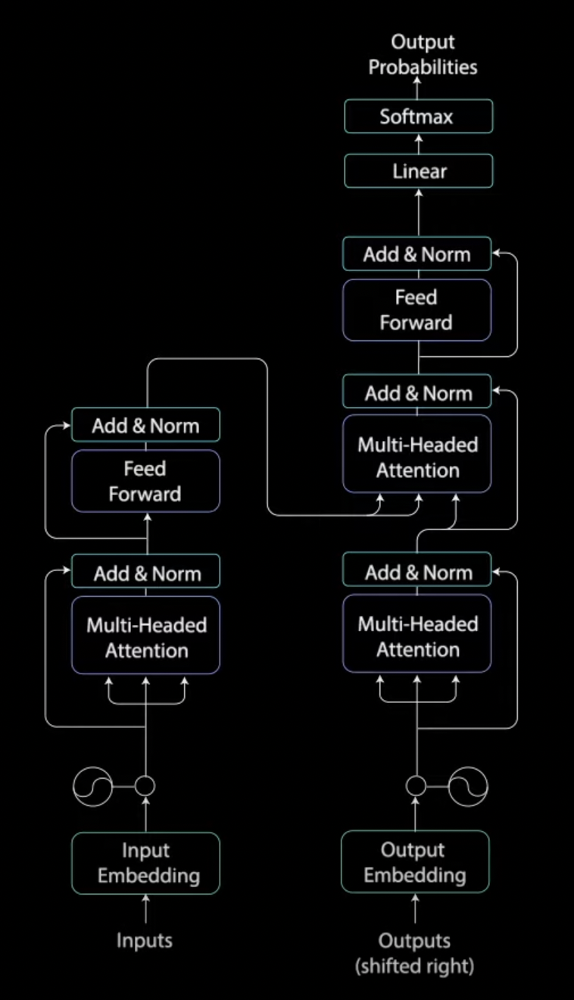

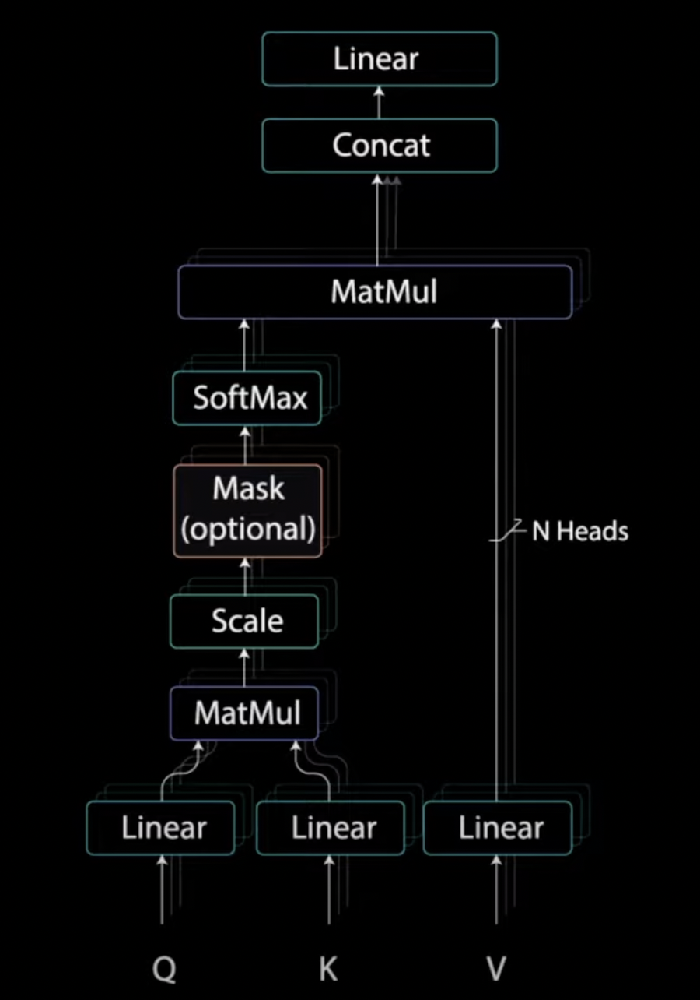

In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
import time
import sys
import math
import datetime
tf.config.run_functions_eagerly(False)
from tensorflow.python.eager.context import executing_eagerly
%pip install -q "tensorflow-text==2.8.*"
import tensorflow_text as text

# Load the TensorBoard notebook extension
%load_ext tensorboard
from google.colab import drive
drive.mount('/content/drive')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


За курсовия проект ще използваме дейтасет, съдържащ кратки текстове и техните обобщаващи заглавия. Дейтасетът съдържа около 55 хиляди примера. Първоначално, желанието ни беше да тренираме нашия модел върху по-голям обем данни, но поради ограниченията на изчислителения ресурс дори в Colab Pro, решихме да използваме този.  

In [ ]:

news_df = pd.read_excel('drive/MyDrive/data.xlsx')

In [ ]:
print((news_df.shape)[0])

55104


In [ ]:
train_length = math.floor((news_df.shape)[0] * 0.7)
validation_length = math.floor((news_df.shape)[0] * 0.2)
test_length = math.floor((news_df.shape)[0] * 0.1)
print(train_length, validation_length, test_length)
validation_start = train_length
validation_end = train_length + validation_length
test_start = validation_end

38572 11020 5510


Нека видим как изглежда малка извадка от дейтасета

In [ ]:
news_df.head(10)

,Headline,Short,Source,Time,Publish Date
0,4 ex-bank officials booked for cheating bank o...,The CBI on Saturday booked four former officia...,The New Indian Express,09:25:00,2017-03-26
1,Supreme Court to go paperless in 6 months: CJI,Chief Justice JS Khehar has said the Supreme C...,Outlook,22:18:00,2017-03-25
2,"At least 3 killed, 30 injured in blast in Sylh...","At least three people were killed, including a...",Hindustan Times,23:39:00,2017-03-25
3,Why has Reliance been barred from trading in f...,Mukesh Ambani-led Reliance Industries (RIL) wa...,Livemint,23:08:00,2017-03-25
4,Was stopped from entering my own studio at Tim...,TV news anchor Arnab Goswami has said he was t...,YouTube,23:24:00,2017-03-25
5,New trailer of &#39;Justice League&#39; released,A new trailer for the upcoming superhero film ...,YouTube,21:50:00,2017-03-25
6,His touch was not right: Shilpa Shinde on sexu...,"Television actress Shilpa Shinde, while openin...",The Quint,21:18:00,2017-03-25
7,Anti-Romeo squads must not trouble consenting ...,"Uttar Pradesh Chief Minister Yogi Adityanath, ...",ANI,23:05:00,2017-03-25
8,Both Romeo and Juliet are welcome in Delhi: AA...,In an apparent jibe at UP&#39;s anti-Romeo squ...,India Today,09:26:00,2017-03-26
9,"30 blasts occur at ordnance factory in MP, 20...",At least 20 people were reportedly injured aft...,Hindustan Times,21:24:00,2017-03-25


Ще разделим дейтасета стандартно на три по-малки
- training
- validation
- test

Върху всеки текст от тренировъчния дейтасет ще добавим токени както следва - в началото \<go>, а в края \<end>, които ще се използват при трениране и оценяване в модела.

Ще използваме, предоставения от keras, Tokenizer чрез който ще премахнем излични знаци. Ще използваме същп \<unk> токен за да обозначим непозната дума.

Посредством Tokenizer ще преобразуваме оригиналния текст и резюмето в sequence-и от цели положителни числа, всяко от които представя различна дума.

In [ ]:
summary = news_df[:train_length]['Headline']
summary_validation = news_df[validation_start:validation_end]['Headline']
summary_test = news_df[validation_end:]['Headline']
document = news_df[:train_length]['Short']
document_validation = news_df[validation_start:validation_end]['Short']
document_test = news_df[validation_end:]['Short']

combined_test = news_df[validation_end:]

print(summary.shape)
print(document.shape)

# for decoder sequence
summary = summary.apply(lambda x: '<go> ' + x + ' <stop>')
summary

# since < and > from default tokens cannot be removed
filters = '!"#$%&()*+,-./:;=?@[\\]^_`{|}~\t\n'
oov_token = '<unk>'
# turn text into tokens represented by positive integers
# oov_token = out of vocabulary token, used for unknown words
document_tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token=oov_token)
summary_tokenizer = tf.keras.preprocessing.text.Tokenizer(filters=filters, oov_token=oov_token)

document_tokenizer.fit_on_texts(document)
summary_tokenizer.fit_on_texts(summary)
# training set
inputs = document_tokenizer.texts_to_sequences(document)
targets = summary_tokenizer.texts_to_sequences(summary)
# validation set
inputs_validation = document_tokenizer.texts_to_sequences(document_validation)
targets_validation = summary_tokenizer.texts_to_sequences(summary_validation)
# test set
inputs_test = document_tokenizer.texts_to_sequences(document_test)
targets_test = summary_tokenizer.texts_to_sequences(summary_test)

(38572,)
(38572,)


Нека разгледаме какъв е размерът на речника (броя уникални думи) за всички текстове и резюмета.

In [ ]:
encoder_vocab_size = len(document_tokenizer.word_index) + 1
decoder_vocab_size = len(summary_tokenizer.word_index) + 1

# vocab_size
encoder_vocab_size, decoder_vocab_size

(63073, 25477)

Ще разгледаме и дължината на текстове и резюметата по квартили.

In [ ]:
# analysis of dataset
document_lengths = pd.Series([len(x) for x in document])
summary_lengths = pd.Series([len(x) for x in summary])

print(document_lengths.describe())
print(summary_lengths.describe())

count    38572.000000
mean       367.516203
std         26.460609
min        280.000000
25%        350.000000
50%        368.000000
75%        387.000000
max        468.000000
dtype: float64
count    38572.000000
mean        65.820906
std          7.096119
min         20.000000
25%         61.000000
50%         66.000000
75%         71.000000
max         96.000000
dtype: float64


Тъй като текстовете и резюметата са с различна дължина, но transformer моделът изисква входа да е с еднаква дължина, ще вземем като дължина стойност малко над 75%-ия квартил.

За по-кратки текстове и резюмета ще добавим padding, който обозначаваме с числото 0.

In [ ]:
# maxlen
# take values of 75th percentile value
encoder_maxlen = 400
decoder_maxlen = 75

inputs = tf.keras.preprocessing.sequence.pad_sequences(inputs, maxlen=encoder_maxlen, padding='post', truncating='post')
targets = tf.keras.preprocessing.sequence.pad_sequences(targets, maxlen=decoder_maxlen, padding='post', truncating='post')

inputs_validation = tf.keras.preprocessing.sequence.pad_sequences(inputs_validation, maxlen=encoder_maxlen, padding='post', truncating='post')
targets_validation = tf.keras.preprocessing.sequence.pad_sequences(targets_validation, maxlen=decoder_maxlen, padding='post', truncating='post')

inputs_test = tf.keras.preprocessing.sequence.pad_sequences(inputs_test, maxlen=encoder_maxlen, padding='post', truncating='post')
targets_test = tf.keras.preprocessing.sequence.pad_sequences(targets_test, maxlen=decoder_maxlen, padding='post', truncating='post')

In [ ]:
# inputs = inputs[:100]
# targets = targets[:100]
print(inputs.shape)
print(targets.shape)

print(inputs_validation.shape)
print(targets_validation.shape)

print(inputs_test.shape)
print(targets_test.shape)

(38572, 400)
(38572, 75)
(11020, 400)
(11020, 75)
(5512, 400)
(5512, 75)


Ще създадам tf.data.Dataset, за да използваме batching функционалността му.

In [ ]:
inputs = tf.cast(inputs, dtype=tf.int32)
targets = tf.cast(targets, dtype=tf.int32)

inputs_validation = tf.cast(inputs_validation, dtype=tf.int32)
targets_validation = tf.cast(targets_validation, dtype=tf.int32)

inputs_test = tf.cast(inputs_test, dtype=tf.int32)
targets_test = tf.cast(targets_test, dtype=tf.int32)

BUFFER_SIZE = 35000
BATCH_SIZE = 64 

dataset = tf.data.Dataset.from_tensor_slices((inputs, targets)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset_validation = tf.data.Dataset.from_tensor_slices((inputs_validation, targets_validation)).batch(BATCH_SIZE)
dataset_test = tf.data.Dataset.from_tensor_slices((inputs_test, targets_test)).batch(BATCH_SIZE)

Тъй като за разлика от рекурентните невронни мрежи и техните подобрения, transformer-а няма вградена последователност, трябва да закодираме реда на думите.

По-долу дефинираме функции, които кодират позициите на думите, така както е описано в статията представящата за първи Transformer архитектурата.

In [ ]:
def get_angles(position, i, d_model):
    angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
    return position * angle_rates

In [ ]:
def positional_encoding(position, d_model):
    angle_rads = get_angles(
        np.arange(position)[:, np.newaxis],
        np.arange(d_model)[np.newaxis, :],
        d_model
    )

    # apply sin to even indices in the array; 2i
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

    # apply cos to odd indices in the array; 2i+1
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

    pos_encoding = angle_rads[np.newaxis, ...]

    return tf.cast(pos_encoding, dtype=tf.float32)

Поради факта, че за по-кратки текстове и резюмета сме добави padding, който не искаме да се взима предвид в модела, ще дефинираме фунцкия за създаване на padding маска.

In [ ]:
def create_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    return seq[:, tf.newaxis, tf.newaxis, :]

Тук дефинираме lookahead маска, която се използва в decoder частта на модела. Нейната роля е да направи възможно дадена дума да има отношение към други думи, тогава и само тогава когато те са преди нея

In [ ]:
# attend only to words before a given word by using band_part which nulls elements in matrix
def create_look_ahead_mask(size):
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask

Следва да дефинираме най-важната за модела част, а именно attention механизма.
В статията - "Attention is all you need", представяща Transformer архитектурата, той се дефинира като
умножение на три вектора - Q (query), K (keys), V (values) с три съответни теглови матрици, чиито тегла всъщност се опитваме да научим по време на обучение.

Първо умножаваме резултата за Q с резултата за K. Разделяме на корен квадратен от dk (размерността на k), за да не получим бързо големи стойности на градиентите. Прилага се padding маска, за да се игнорират всички padding токени.

Прилагаме softmax функция върху резултата и го умножаваме с резултата за V.

In [ ]:
def scaled_dot_product_attention(q, k, v, mask):
    matmul_qk = tf.matmul(q, k, transpose_b=True)

    dk = tf.cast(tf.shape(k)[-1], tf.float32)
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)
    # apply padding mask
    if mask is not None:
        scaled_attention_logits += (mask * -1e9)  

    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)

    output = tf.matmul(attention_weights, v)
    return output, attention_weights

Ключово за модела е използването на няколко attention head -а, което се прави с цел всеки attention head да намира различни зависимости между думите, спомагайки модела да придобие по-голяма репрезентативна сила.

За имплементиране на отделните слоеве в модела, ще изпозлваме subclassing API-a на keras.

In [ ]:
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        # divide embedding size by num heads must be divisible
        assert d_model % self.num_heads == 0
        
        self.depth = d_model // self.num_heads

        self.wq = tf.keras.layers.Dense(d_model)
        self.wk = tf.keras.layers.Dense(d_model)
        self.wv = tf.keras.layers.Dense(d_model)

        self.dense = tf.keras.layers.Dense(d_model)
        
    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])
    
    def call(self, v, k, q, mask):
        batch_size = tf.shape(q)[0]

        q = self.wq(q)
        k = self.wk(k)
        v = self.wv(v)

        q = self.split_heads(q, batch_size)
        k = self.split_heads(k, batch_size)
        v = self.split_heads(v, batch_size)

        scaled_attention, attention_weights = scaled_dot_product_attention(
            q, k, v, mask)
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])
        concat_attention = tf.reshape(scaled_attention, (batch_size, -1, self.d_model))
        output = self.dense(concat_attention)
            
        return output, attention_weights

Тук дефинираме feed forward layer, който се използва след обработката данните от multi-head attention механизма в encoder и decoder.
Използваме активационна функция ReLu, за да опишем нелинейната функцията, която се опитваме да обучим.

In [ ]:
def point_wise_feed_forward_network(d_model, dff):
    return tf.keras.Sequential([
        tf.keras.layers.Dense(dff, activation='relu'),
        tf.keras.layers.Dense(d_model)
    ])

Дефинираме клас за слой от Encoder. Даден Encoder може да се състои от n такива слоя, като в нашата имплементация ние използваме 4. Първия слой приема за вход текста под формата на embedding-и, а последващите слоеве - изхода от предишния encoder слой. Изходът от финалния encoder слой ще се използва от Decoder-а.

Всеки слой съдържа в себе си:
- слой за multi-head attention
- feed forward network
- слоеве за нормализация 

Значимо при тази архитектура са residual connection-ите, които спомагат при изчислението на градиентите.

Използваме и dropout keras layer при трениране на модела, който да изключва част от невроните, за да не се получи overfitting и модела да генерализира по-добре.

In [ ]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(EncoderLayer, self).__init__()

        self.multi_head_attention = MultiHeadAttention(d_model, num_heads)
        self.feed_forward_network = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
    
    def call(self, x, training, mask):
        attn_output, _ = self.multi_head_attention(x, x, x, mask)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)

        ffn_output = self.feed_forward_network(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)

        return out2

Следва да дефинираме и клас за Decoder layer-a. Той е подобен на този за encoder-a, с разликата че имаме още един multi-head attention layer. За негов вход изпозваме или label резюмето при трениране на модела или output до този момент от transformer-a при evaluation. Освен това при него се използва lookahead маска, докато при втория такъв слой се използва само padding маска.

При втория multi-head attention layer за вход на Q и К взимаме изхода от encoder-а, а за V взимаме изхода от първия multi-head attention layer.

Както и при encoder layer след всеки multi-head layer имаме layer за нормализация. Накрая се преминава през feed forward network.

In [ ]:
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(DecoderLayer, self).__init__()

        self.multi_head_attention_1 = MultiHeadAttention(d_model, num_heads)
        self.multi_head_attention_2 = MultiHeadAttention(d_model, num_heads)

        self.feed_forward_network = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        self.dropout3 = tf.keras.layers.Dropout(rate)
    
    def call(self, x, enc_output, training, look_ahead_mask, padding_mask):
        attn1, attn_weights_block1 = self.multi_head_attention_1(x, x, x, look_ahead_mask)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)

        attn2, attn_weights_block2 = self.multi_head_attention_2(enc_output, enc_output, out1, padding_mask)
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)

        ffn_output = self.feed_forward_network(out2)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)

        return out3, attn_weights_block1, attn_weights_block2

Дефинираме класове за Encoder и Decoder, които използват encoder, decoder layer-ите споменати горе.

In [ ]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size, maximum_position_encoding, rate=0.1):
        super(Encoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Embedding(input_vocab_size, d_model)
        self.pos_encoding = positional_encoding(maximum_position_encoding, self.d_model)

        self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) for _ in range(num_layers)]

        self.dropout = tf.keras.layers.Dropout(rate)
        
    def call(self, x, training, mask):
        seq_len = tf.shape(x)[1]

        x = self.embedding(x)
        # (64, 400, 128)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)
    
        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training, mask)
        return x

In [ ]:
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size, maximum_position_encoding, rate=0.1):
        super(Decoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers
        # target_vocab_size input dimensions 400 or 75
        # d_model output dimensions 128
        self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)

        self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)
    
    def call(self, x, enc_output, training, look_ahead_mask, padding_mask):
        seq_len = tf.shape(x)[1]
        attention_weights = {}
        # get embeddings for each word of summary, for each summary in batch
        # (64, 75, 128)
        x = self.embedding(x)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training, look_ahead_mask, padding_mask)

            attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
            attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
    
        return x, attention_weights

Дефинираме Transformer клас. След като получим изход от последния decoder-а, резултата се обработва от финалния слой на Transformer, който връща тензори с размерност броя думи в резюметата. Изходът представлява logits, които по-късно, при трениране, се обработват от Softmax функция.

In [ ]:
class Transformer(tf.keras.Model):
    def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size, target_vocab_size, pe_input, pe_target, rate=0.1):
        super(Transformer, self).__init__()

        self.encoder = Encoder(num_layers, d_model, num_heads, dff, input_vocab_size, pe_input, rate)

        self.decoder = Decoder(num_layers, d_model, num_heads, dff, target_vocab_size, pe_target, rate)

        self.final_layer = tf.keras.layers.Dense(target_vocab_size)
    
    def call(self, inp, tar, training, enc_padding_mask, look_ahead_mask, dec_padding_mask):
        enc_output = self.encoder(inp, training, enc_padding_mask)

        dec_output, attention_weights = self.decoder(tar, enc_output, training, look_ahead_mask, dec_padding_mask)

        final_output = self.final_layer(dec_output)

        return final_output, attention_weights

Ще използваме хиперпараметрите посочени в статията.

In [ ]:
# hyperparameters
num_layers = 4 # number of encoder and decoder layers
d_model = 128 # used for embeddings size used inside model
dff = 512 #used in pointwise densely connected vector
num_heads = 8 # number of multi head attention
EPOCHS = 100 # training epochs

В статията се предлага да се иползва custom learning rate scheduler за по-бърза сходимост.

In [ ]:
#The transformer paper also suggests training on a custom learning rate scheduler that helps faster convergence
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()

        self.d_model = d_model
        self.d_model = tf.cast(self.d_model, tf.float32)

        self.warmup_steps = warmup_steps
    
    def __call__(self, step):
        arg1 = tf.math.rsqrt(step)
        arg2 = step * (self.warmup_steps ** -1.5)

        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)
        

In [ ]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)  

За loss функция ще използваме SparseCategoricalCrossentropy от keras. Тази функция е подходяща при класификационни задачи като тази и когато входа и е под формата на embedding, а не one-hot репрезентация.

In [ ]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [ ]:
# examine
def loss_function(real, pred):
    # get categorical cross entropy loss value, it applies softmax internally
    loss_ = loss_object(real, pred)
    # mask to ignore paddings in loss calculation
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    # tf.reduce_sum(mask) - number of words
    # tf.reduce_sum(loss_) - sum of loss for words
    # mean loss for words that are not padding
    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

Дефинираме метрики, които ще измерваме при трениране и по-късно ще визуализираме чрез tensorboard.

In [ ]:
train_loss = tf.keras.metrics.Mean(name='train_loss', dtype=tf.float32)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')
validation_loss = tf.keras.metrics.Mean(name='validation_loss', dtype=tf.float32)
validation_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('validation_accuracy')

Инстанциране на Transformer класа.

In [ ]:
transformer = Transformer(
    num_layers, 
    d_model, 
    num_heads, 
    dff,
    encoder_vocab_size, 
    decoder_vocab_size, 
    pe_input=encoder_vocab_size, 
    pe_target=decoder_vocab_size,
)

Помощна функция за създаване на маски.

In [ ]:
def create_masks(inp, tar):
    enc_padding_mask = create_padding_mask(inp)
    dec_padding_mask = create_padding_mask(inp)

    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
  
    return enc_padding_mask, combined_mask, dec_padding_mask

Използваме чекпойнти за да запазим обучените тегла между епохите.

In [ ]:
checkpoint_path = "drive/MyDrive/checkpoints"

ckpt = tf.train.Checkpoint(transformer=transformer, optimizer=optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=1)

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [ ]:
@tf.function
def train_step(inp, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    
    enc_padding_mask, combined_mask, dec_padding_mask = create_masks(inp, tar_inp)

    with tf.GradientTape() as tape:
        predictions, _ = transformer(
            inp, tar_inp, 
            True, 
            enc_padding_mask, 
            combined_mask, 
            dec_padding_mask
        )
        loss = loss_function(tar_real, predictions)

    gradients = tape.gradient(loss, transformer.trainable_variables)    
    optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))

    train_loss(loss)
    train_accuracy(tar_real, predictions)

Дефиниране на пътища за съхранение на логове и метрики.

In [ ]:
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'drive/MyDrive/text-sum2/logs/gradient_tape/' + current_time + '/train'
validation_log_dir = 'drive/MyDrive/text-sum2/logs/gradient_tape/' + current_time + '/validation'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
validation_summary_writer = tf.summary.create_file_writer(validation_log_dir)
logdir = 'drive/MyDrive/text-sum2/logs/func/%s' % current_time
writer = tf.summary.create_file_writer(logdir)

In [ ]:
tf.summary.trace_on(graph=True, profiler=False)

Тренировъчен цикъл, изпълняващ даден брой епохи.
След всяка епоха се създава чекпойнт и се изчислява loss функцията на модела върху validation дейтасета.

In [ ]:
ckpt.restore(ckpt_manager.latest_checkpoint)
if ckpt_manager.latest_checkpoint:
    print("Restored from {}".format(ckpt_manager.latest_checkpoint))
else:
    print("Initializing from scratch.")
for epoch in range(EPOCHS): 
    start = time.time()

    # Reset metrics every epoch
    train_loss.reset_states()
    validation_loss.reset_states()
    train_accuracy.reset_states()
    validation_accuracy.reset_states()
  
    for (batch, (inp, tar)) in enumerate(dataset):
        # print('tar', tar)
        train_step(inp, tar)
        # we display 3 batch results -- 0th, middle and last one (approx)
        if batch % 429 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1, batch, train_loss.result()))
      
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    
    print ('Epoch {} Loss {:.4f}'.format(epoch + 1, train_loss.result()))

    print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

    with train_summary_writer.as_default():
      tf.summary.scalar('loss', train_loss.result(), step=epoch)
      tf.summary.scalar('accuracy', train_accuracy.result(), step=epoch)

    # calculate loss over validation set
    for (batch, (inp, tar)) in enumerate(dataset_validation):
      tar_inp = tar[:, :-1]
      tar_real = tar[:, 1:]
      enc_padding_mask, combined_mask, dec_padding_mask = create_masks(inp, tar_inp)
      predictions, _ = transformer(
            inp, tar_inp, 
            True, 
            enc_padding_mask, 
            combined_mask, 
            dec_padding_mask
      )
      loss = loss_function(tar_real, predictions)
      # tf.print('validation loss is:', loss)
      validation_loss(loss)
      validation_accuracy(tar_real, predictions)
    with validation_summary_writer.as_default():
      tf.summary.scalar('loss', validation_loss.result(), step=epoch)
      tf.summary.scalar('accuracy', validation_accuracy.result(), step=epoch)

Експортване на графа за визуализация.

In [ ]:
with writer.as_default():
  tf.summary.trace_export(
    name="transformer_graph",
    step=0,
    profiler_outdir=logdir)

Функции за сумаризиране на даден текст.

In [ ]:
def evaluate(input_document):
    input_document = document_tokenizer.texts_to_sequences([input_document])
    input_document = tf.keras.preprocessing.sequence.pad_sequences(input_document, maxlen=encoder_maxlen, padding='post', truncating='post')

    # add dimension for batch_size dimension
    encoder_input = tf.expand_dims(input_document[0], 0)

    decoder_input = [summary_tokenizer.word_index["<go>"]]
    output = tf.expand_dims(decoder_input, 0)
    for i in range(decoder_maxlen):
        
        enc_padding_mask, combined_mask, dec_padding_mask = create_masks(encoder_input, output)

        predictions, attention_weights = transformer(
            encoder_input, 
            output,
            False,
            enc_padding_mask,
            combined_mask,
            dec_padding_mask
        )
        # find maximum score for each summary vocabulary words
        predictions = predictions[: ,-1:, :]
        # get maximal prediction value for words
        predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
        if predicted_id == summary_tokenizer.word_index["<stop>"]:
            return tf.squeeze(output, axis=0), attention_weights
        # append predicted to previously predicted
        output = tf.concat([output, predicted_id], axis=-1)
    # output has size (1, output_length)
    # squeze returns tensor of dimension (output_length)
    return tf.squeeze(output, axis=0), attention_weights

In [ ]:
def summarize(input_document):
    # not considering attention weights for now, can be used to plot attention heatmaps in the future
    summarized = evaluate(input_document=input_document)[0].numpy()
    # expand dims because sequences_to_texts expects arr
    summarized = np.expand_dims(summarized[1:], 0)  # not printing <go> token
    return summary_tokenizer.sequences_to_texts(summarized)[0]  # since there is just one translated document

In [ ]:
document_test[52114]

'According to a report, two of the six terrorists who were killed in the Pathankot air base attack in Punjab on January 2 had entered the base at least 48 hours prior to the encounter. The National Investigation Agency is reportedly probing the role of an insider who assisted the terrorists by cutting the fencing and supplying arms and ammunition.'

In [ ]:
print("Real Headline : ", summary_test[52114],"\n Predicted Summary : ", summarize(document_test[52114]))

Real Headline :  Terrorists entered Pathankot base before attack 
 Predicted Summary :  three suspects troops from military expressway in afghanistan


In [ ]:
document_test[53281]

'At least 13 people lost their lives and 20 others were wounded in an accident involving a state transport bus and a cement-laden lorry in the Madurai district of Tamil Nadu on Saturday. The bus was on its way from Rajapalayam in Virudhunagar district to Kumily in Kerala when the accident occurred in T Kallupatti town. An investigation is underway. '

In [ ]:
print("Real Headline : ", summary_test[53281],"\n Predicted Summary : ", summarize(document_test[53281]))

Real Headline :  Bus-lorry collision leaves 13 dead in Tamil Nadu 
 Predicted Summary :  17 yr old beaten up truck rams into national in bangladesh


In [ ]:
document_test[49989]

'Indian Foreign Secretary Subrahmanyam Jaishankar and his Pakistani counterpart Aizaz Ahmad Chaudhry on Tuesday exchanged courtesies at the SAARC dinner in Nepal. The meet marks the first official interaction between the two foreign secretaries since the January 2 terror attacks on the Pathankot airbase, which derailed bilateral ties between the nations.'

In [ ]:
print("Real Headline : ", summary_test[49989],"\n Predicted Summary : ", summarize(document_test[49989]))

Real Headline :  India, Pak foreign secretaries meet 
 Predicted Summary :  india vietnam prez welcomes pm nawaz sharif


In [ ]:
document[12332]

'Italian archaeologists have recently discovered a Stonehenge-like prehistoric sundial in Sicily. Professional experts used cameras and drones to confirm that the sundial could have been used by people to track seasons. The &#39;calendar rock&#39; reportedly features a 3.2-foot-diameter hole and 23-foot-high stone walls. The discovery was made while the archaeologists were surveying nearby WWII bunkers.'

In [ ]:
print("Real Headline : ", summary[12332],"\n Predicted Summary : ", summarize(document[12332]))

Real Headline :  <go> Stonehenge-like prehistoric sundial discovered in Italy <stop> 
 Predicted Summary :  italian town raising wood extinction just 17


Визуализране на метрики и граф с tensorboard.

In [ ]:
%tensorboard --logdir 'drive/MyDrive/text-sum2/logs/gradient_tape'

Reusing TensorBoard on port 6006 (pid 381), started 0:14:45 ago. (Use '!kill 381' to kill it.)

<IPython.core.display.Javascript object>